# 필터링

자 그래서 우리가 이제 어떤 그 뭐 이미지를 돌리고 회전시키고 뭐 휘어진 거를 바로 잡고 이제 이런 거를 해봤는데 다음 시간에 할 거는 이미지에 어떤 주파수가 있거든요

그래서 우리가 색도 사실은 주파수 고 그 다음에 어떤 모양도 주파수 라고 생각을 할 수 있습니다.

모양을 보면 우리가 이제 이미지를 보면 모양이 이렇게 촘촘하게 변하는 데가 있고 별로 그렇게 심하게 변하지 않는 데가 있는데 주파수라는 게 이제 이런 식으로 그 정확히 말은 파장이지만 주파수가 짧으면은 아니죠

주파수가 높으면은 이렇게 급격하게 변하고 주파수가 낮으면은 이렇게 원만하게 변하잖아요.

노이즈 캔슬링하는 헤드셋 같은 것 중에 잡음 제거해주는 헤드셋이 있잖아요

잡음을 어떻게 제거하냐면 잡음의 주파수를 측정을 해 가지고 역으로 주파수를 걸어주면 잡음이 이런 식으로 오고 있는데 반대로 주파수를 이렇게 걸어 가지고 그러면 두 개가 더해지면 팡팡해지겠죠

그럼 잡음이 없어지는 건데 이미지 상에서도 예를 들면 여기 자글자글하게 뭐가 들어가 있다

근데 이게 일정 간격으로 들어오는 노이즈면 역으로 그걸 걸어주면 그 노이즈를 없앨 수가 있겠죠

그런 개념이 공간 주파수의 필터링인데 그래서 우리가 보면 이미지가 원래는 이렇게 돼 있었는데 어떤 특정 주파수를 제거하면 이렇게도 되고 이런 식으로도 되고 이미지를 여러 가지 형식으로 주파수를 필터링을 할 수 있습니다

그래서 주파수라는 것은 이 화소의 밝기가 얼마나 빨리 변하느냐

이런 얘기고 주파수가 높다는 것은 이렇게 빨리 변한다는 거고 주파수가 낮다는 것은 원만하게 변하는 거죠

그래서 이런 배경 같은 데는 대체로 저주파 영역이고 뭔가

이런 형상이 있는 부분은 대체로 고주파가 되고요 그 다음에 색깔과 색깔의 이런 경계선 이런 데도 고주파 영역이 됩니다

In [1]:
#!hide
from PIL import Image
import cv2
import os
def show(image):
    rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB) # BGR → RGB로 채널 순서 변경
    return Image.fromarray(rgb) # 객체 변환: 넘파이 배열 → PIL 형식으로
os.chdir('data')

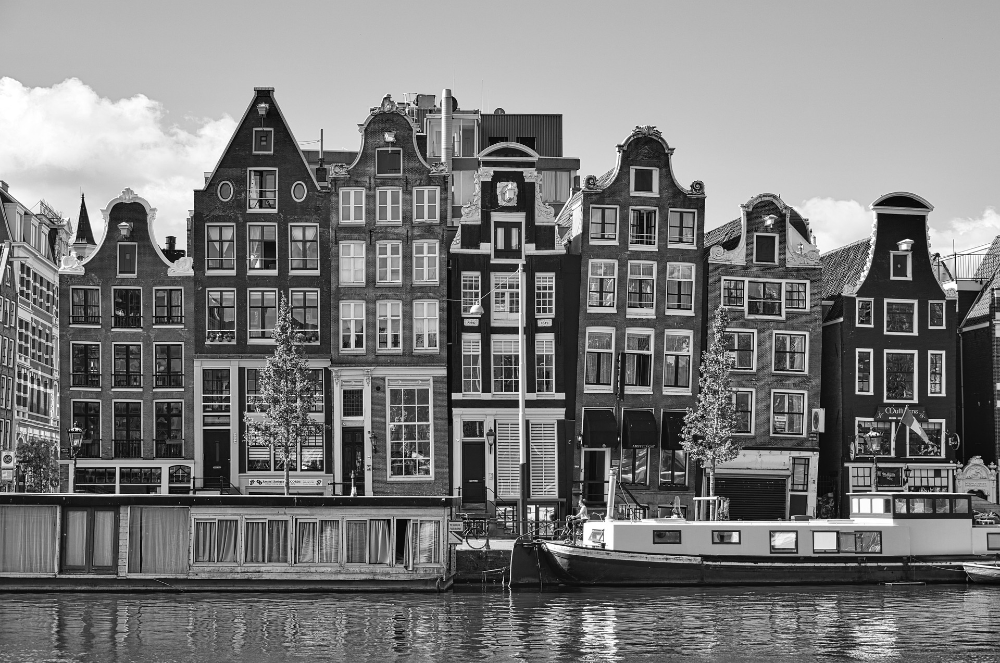

In [ ]:
import cv2
src = cv2.imread('buildings.jpg', cv2.IMREAD_GRAYSCALE)
Image.fromarray(src)

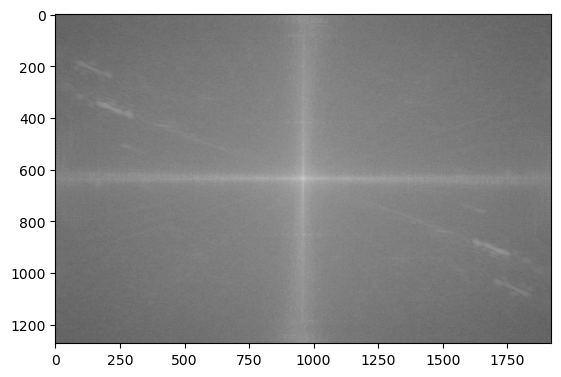

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
dft = np.fft.fft2(src)
fshift = np.fft.fftshift(dft)
magnitude_spectrum = 20*np.log(np.abs(fshift))
plt.imshow(magnitude_spectrum, cmap = 'gray')

그래서 우리가 건물 이미지를 흑백으로 불러와 가지고 우리가 보통 밝기 변화를 가지고 하니까 컬러는 별로 필요가 없어요

그래서 이거를 푸리에 변환이라는 걸 하는데 푸리에 변환은 뭐냐 하면은 어떤 그 여러가지 그 주파수가 섞여 있는 이제 함수가 있을 때 그거를 어떤 사인파들로 이제 변환하는 것을 푸리에 변환이라고 합니다

근데 우리가 이제 색은 그 밝기가 연속적으로 변하는 게 아니라 이제 이산적으로 변하기 때문에 이산 푸리에 변환이라는 것을 해요

그래서 원래 이미지를 주파수 대역별로 분해를 하는 거죠

그래서 이제 여기 있는 이 그림은 뭐냐면 이쪽 방향의 변화를 주파수 대역별로 표시를 한 거고 그 다음에 또 이쪽 방향의 색깔 변화를 주파수 대역별로 표시를 한 건데 이거를 이제 여기가 0이 되도록 옮긴 겁니다

숫자는 여기가 이제 600, 1000 돼 있지만 실제로는 화면 가운데가 0이고 그러니까 이 가운데가 지금 좀 밝고 여기서 멀어지면 별로 안 밝습니다

없잖아요

그 얘기는 뭐냐 하면 저주파 이게 이제 다 저주파 거든요

수평 방향이건 수직 방향이건 저주파 성분이 많다 라고 할 수가 있습니다

저주파 영역이 좀 있고 고주파 영역은 별로 없죠

그 다음에 이게 좌우대칭인데 왜냐하면 주파수라는게 그 사인파라는게 사인함수가 보면 위상이 계속 반복되기 때문에 어차피 이걸 대칭으로 마이너스로 대칭을 시켜도 똑같거든요

모양이 그래서 이제 0점을 기준으로 좌우 전후좌우가 대칭입니다

사실은 대각선 방향만 보시면 돼요

저주파 영역이 많은 그림이다 보시면은 뭐 이미지의 대부분이 이런데 저주파 영역이고 그렇습니다

그래서 고주파는 그렇게 세지 않다

사실 대부분 이미지가 그렇게까지 고주파가 강하지는 않아요

왜냐하면 픽셀과 픽셀의 간격이 한정이 돼 있기 때문에 아무리 고주파를 하려고 해도 한 픽셀보다 더 짧은 파장이 불가능하다고 생각합니다

불가능하죠

그러니까 애초에 파장 길이가 좀 한정이 돼 있습니다

## 고주파 통과 필터

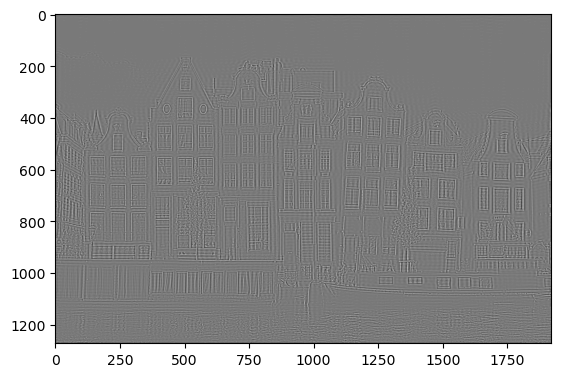

In [168]:
height, width = src.shape
cy, cx = height//2 , width//2
fshift2 = fshift.copy()
cut = 100 # 자를 범위
fshift2[cy-cut:cy+cut, cx-cut:cx+cut] = 0 # 저주파 제거
f_ishift = np.fft.ifftshift(fshift2) # 주파수 역변환
img_back = np.fft.ifft2(f_ishift) # 이미지 역변환
img_back = np.real(img_back) # 실수부만 취함
plt.imshow(img_back, cmap = 'gray') # 실수부만 취함


그래서 우리가 특정한 주파수만 통과를 시킬 수 있는데 그래서 고주파 영역을 통과시키고 저주파를 잘라내면 고주파 통과 필터 하이패스 필터라고 하고요 줄여서 HPF라고 합니다

그래서 이제 이거 이름을 보실 때 좀 헷갈리기 쉬운데 고주파 통과 필터 이러면 고주파를 자른다는 거예요 통과시킨다는 거예요 헷갈릴 수 있는데 통과니까 고주파는 통과시키고 그러니까 파형이 예를 들어서 이런 식으로 생겨있다 그리기가 되게 힘드네요

이렇게 생긴 거랑 원만하게 생긴 거랑 이렇게 섞여 있다 그러면 고주파 통과 필터를 통과하면 이것만 남는 거죠

이것만 남고 원만한 거는 잘려 나가서 없어지는 겁니다

그래서 이제 이 코드는 원만하게 생긴 거랑 섞여있다 그러면 고주파 통과 필터를 통과하면 이것만 남는 거죠

원본 이미지가 있는데 원본 이미지에서 저주파 영역을 제거를 하는 거예요

저주파 영역을 제거를 하고 그러니까 원본 이미지에서 여기 흰색으로 나와 있는 여기 있죠

여기 저주파 영역을 싹 날려버리면 결국에는 이런 어떤 배경에 해당되는 부분들 색깔이 다 날라가 버립니다

배경에 해당되는 부분 색깔들이 나타나고 그다음에 이제 뭐만 남냐 하면은 이 경계와 경계 여기 보시면은 이제 이 경계가 남아있고 이 경계와 경계 여기 보시면은 이제 이 경계가 남아있고 이 경계와 경계 여기 보시면은 이제 이 경계가 남아있고 이미지의 어떤 경계에만 남죠

그래서 이미지의 경계에서는 그 색깔이 급격하게 변하기 때문에 굉장히 주파수가 높아요

그래서 고주파 통과 필터를 통과시키면은 이제 고주파 영역 즉 경계에만 남게 됩니다

그래서 이제 우리가 이제 이미지를 이미지를 주파수로 변환시킬 수도 있고 반대로 주파수를 다시 합치면은 반대로 주파수를 다시 합치면은 예를 들면 우리가 이런 이미지가 있으면 이거는 결국에는 이렇게 고주파와 저주파로 분해를 할 수 있잖아요

그래서 프리에이트랜스폼이라는 게 이렇게 분해를 하는 거고 이걸 다시 합치면은 이제 이미지가 되는 거죠

주파수들을 합치면 그래서 주파수를 역변환을 해가지고 이미지로 다시 만드는 그래서 이 IMG100 하면은 이제 이미지가 되는데 그러면은 어떤 경계선 테두리만 이렇게 싹 남게 됩니다

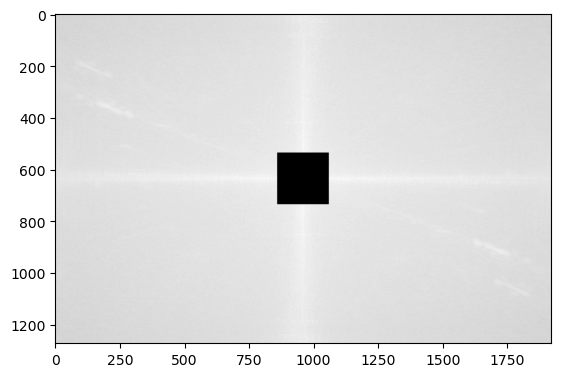

In [169]:
magnitude_spectrum = 20*np.log(np.abs(fshift2 + 1e-10)) # fshift -> fshift2
plt.imshow(magnitude_spectrum, cmap = 'gray')


여기 앞에서 한 장 앞으로 가서 여기 2, 3프레임 변환할 때 맨 끝에 두 줄 있죠

맨 끝에 두 줄을 복사하셔가지고 이렇게 붙여 넣으시고 그 다음에 여기 f-shift라고 원래 돼 있는데 f-shift라고 돼 있는 거를 f-shift2로 바꿔주세요 그 다음에 여기 수식을 변환하면 여기 로그함수가 들어가는데 로그함수는 로그 0은 마이너스 무한되기 때문에 로그 0이 있으면 안 됩니다

우리가 잘라낼 때 잘라낸 주파수가 0이 되기 때문에 로그 0이 되거든요

그래서 여기 아주 작은 수 1, 2, 마이너스 10 이렇게 썼는데 이게 10의 마이너스 1승이라는 뜻이에요

그래서 0이 되는 걸 막기 위해서 약간 작은 숫자를 하나 더해 준 겁니다

그래서 그려보면은 우리가 주파수 영역에서 이렇게 주파수들이 있는데 아주 낮은 영역의 주파수가 이렇게 잘려 있는 거를 보실 수가 있죠

그래서 우리가 예를 들면은 여기서 아까 잘라낼 때 잘라내는 범위를 100 이렇게 하면은 여기서 이제 이런 식으로 보이는데 이거를 주파수 대역에서 보면은 이만큼을 주파수 정보 중에 이만큼을 잘라낸 것 같아요

그래서 이 주파수 대역에서 보면은 이렇게 해가지고 주파수 대역에서 어디가 잘려 나가는지를 보시면 되겠어요

## 저주파 통과 필터

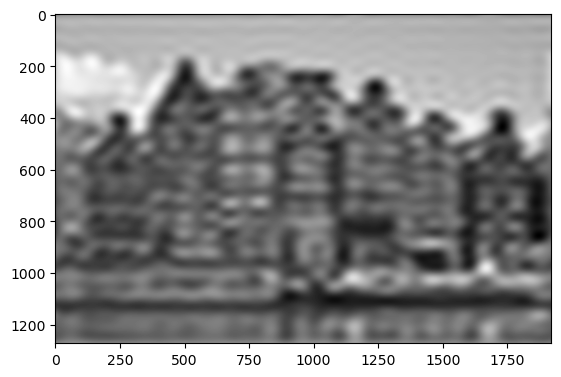

In [174]:
fshift2 = fshift.copy()
cut = 20
mask = np.zeros_like(src)
mask[cy-cut:cy+cut, cx-cut:cx+cut] = 1 # 저주파만 남김
fshift2 = fshift2 * mask
f_ishift = np.fft.ifftshift(fshift2)
img_back = np.fft.ifft2(f_ishift)
img_back = np.real(img_back) # 실수부만 취함
plt.imshow(img_back, cmap = 'gray')


다음이 저주파 통과 필터죠

저주파 통과 필터는 고주파 통과 필터랑 코드가 비슷한데 여기 잘 보시면 여기가 달라요

여기가 다르고 여기가 다른데 고주파 통과 필터는 아까 보시면 여기 저주파 영역을 잘라내고 나머지를 통과시키는데 저주파 통과 필터는 저주파만 남기고 나머지를 다 잘라내는 거죠

그래서 그렇게 되면 여기 아래 그림을 보시면 그림이 굉장히 뭉개져 있습니다

저주파라는 게 천천히 변하는 거기 때문에 뭔가 이렇게 윤곽선 이런 게 다 없어지고 다 이렇게 형체가 뭉개져가지고 애매하게 이렇게 뭉개지는 거죠

그래서 우리가 왜 흔히 말하는 모자이크 처리한다고 하는데 모자이크 처리하는 게 모자이크 처리도 종류가 여러 개 있는데 그중에 깍두기 깍두기 하는 그런 원래 모자이크 말고 블러라고 하는데 흐릿하게 만드는 거 있죠

그게 결국에는 저주파 통과 필터입니다

우리가 그 외에 보면 화장실 호텔 같은 데 보면 가끔 화장실하고 방하고 벽을 유리로 만들어가지고 흐릿한 유리를 만들어 놓은 게 있잖아요

그 유리벽이 뭐냐면 물체로 만든 저주파 통과 필터인 거예요

그렇죠?

어떤 빛의 주파수 중에 고주파는 산란시키고 저주파만 통과하게 만든 그런 필터죠

그래서 이것도 해보시면 이렇게 저주파만 통과하기 때문에 어떤 뚜렷한 형체 없는 이런 식으로 되고 이것도 컷을 바꿔보시면 예를 들면 컷을 100 이렇게 해보시면 이제 아주 고주파만 잘라내니까 형체가 어느 정도 있죠

그 다음에 이거를 5 이렇게 하면 이제 거의 형체를 알아볼 수가 없죠 보시면 검정 검정 하얀 이렇게 굉장히 완만하게 변하잖아요 형체를 거의 알아볼 수가 없어요

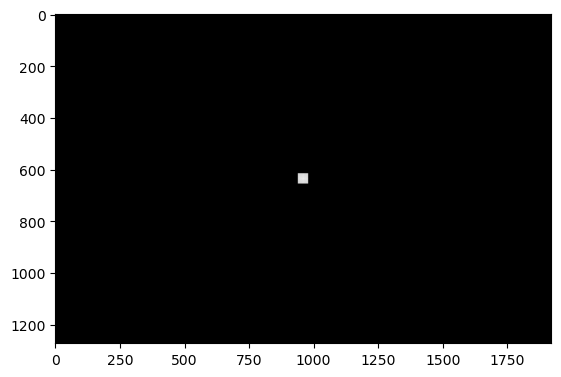

In [175]:
magnitude_spectrum = 20*np.log(np.abs(fshift2 + 1e-10)) # fshift -> fshift2
plt.imshow(magnitude_spectrum, cmap = 'gray')

그래서 이제 이거를 응용하시면 여러 가지를 할 수 있는데 우리가 예를 들면은 요즘에는 그런 경우는 잘 없지만 옛날에 아날로그 텔레비전 같은 경우는 찡 하면서 이렇게 잡음이 일정하게 생기는 경우가 있어요

왜냐하면 아날로그니까 정말 그 주파수들이 그대로 들어와서 화면에 뿌려지니까 이렇게 아날로그 텔레비전 보신 분들이 여기 많이 있을 것 같지는 않지만 이렇게 주파수 같은 게 일정하게 이렇게 잡음이 노이즈가 생기는 경우가 있거든요

그럼 그 노이즈의 주파수를 찾아 가지고 그 주파수를 그냥 날려버리면 화면이 깨끗해집니다

우리가 이제 요즘에는 그런 거를 볼 일이 없어서 뭐 별로 의미가 없긴 한데 그렇게 약간 일정하게 생기는 노이즈 같은 경우는 지금은 이제 이 안쪽만 남긴다던가 바깥쪽만 남긴다던가 하는데 예를 들어서 이렇게 주파수가 있는데 예를 들면 여기 선이 하나 이렇게 그어진다 그러면은 그거 뭐예요

그 노이즈가 일정하게 있는 거죠

그럼 그 선이 그어지는 부분만 딱 정확하게 잘라내버리면 그 노이즈를 싹 없애버릴 수가 있습니다.

일정하게 생기는 노이즈인 경우에 요즘에 그런 걸 볼 일이 있나요

아날로그 장비를 잘 안 쓰니까 혹시 보실 일이 있으면 그런 경우에는 그렇게 없애시면 된다

## 컨볼루션

컨볼루션은 어떤 우리가 이미지 처리를 할 때 굉장히 많이 사용하는 필터링 방법 중에 하나입니다

컨볼루션은 어떻게 하냐면 우리가 이제 요게 어떤 그림이에요

그림이고 숫자가 이제 픽셀의 밝기라고 생각하시면 됩니다

그래서 이런 픽셀의 밝기가 있으면 여기에 이제 필터라고도 하고 커널이라고도 하고 마스크라고도 하고 책에 따라서 용어가 다른데 이게 사람마다 용어가 다르니까 제일 많이 쓰는 표현은 커널을 제일 많이 쓰고 그 다음으로는 필터 그 다음으로 마스크라고 하는데 마스크라는 용어는 딴 데서도 또 쓰기 때문에 이게 좀 혼동의 여지가 있어요

그래서 이제 가장 많이 쓰고 혼동이 좀 적은 거는 커널을 제일 많이 씁니다

어쨌든 이 컨볼루션이라는 계산은 뭐냐면 예를 들어서 우리가 이제 3 곱하기 3 요런 커널이 있어요

1 0 마이너스 1 1 0 마이너스 1 1 0 마이너스 1 요런 커널이 있으면 요 왼쪽에 보시면은 요렇게 이제 어떤 이미지가 있죠

그러면은 어떻게 하냐면은 요 가로 3칸짜리를 요 이미지에다가 이렇게 얹는 거예요

얹어가지고 같은 자리에 있는 것끼리 계산을 합니다

그래서 지금 여기 화살표에 가려서 여기 있는 숫자는 안 나오는데 그럼 여기 옆 칸을 보면 지금 925 624 454 이렇게 돼 있죠

그러면 여기 1 1 1 0 0 0 마이너스 1 마이너스 마이너스 1을 여기다 얹어요

1 1 1 그리고 vice versa 2 1 1 1 5 2 3 4 5 6 7 7 8 아와 계속 여긴 thành lips 엘르 어떻게 또 합친 front 은 중 cheerful 쫘는 아 아 additionally 마이너스 available 하지만 tms 가 awfully offerings 하면 4고 마이너스 4하니까 없어지고 6에다가 4 4 없어지니까 6이 되겠죠

다 더하면 그래서 요 칸에는 6이 들어가는 거에요

그 다음에 요걸 한 칸 오른쪽으로 옮겨요

그럼 이제 2 5 8 2 4 0 5 4 5 이렇게 되는데 똑같이 합니다

빨리 해보면 1 1 1 마이너스 1 마이너스 1 마이너스 1이니까 가운데는 어차피 0이라서 다 없어질 거고 2 2 5 다 더하면 9죠

그 다음에 8 5 하면은 마이너스 13이니까 마이너스 4가 되겠네요

요 옆에는 마이너스 4가 됩니다

이런식으로 계속 계산을 반복하는 것을 컨볼루션 이라고 해요

그래서 이렇게 컨볼루션을 하면은 여러가지 어떤 필터링을 할 수가 있는데 예를 들면 이제 요 필터 같은 경우에는 어떤걸 하느냐 하면은 요 필터를 잘 보시면 결국에는 어떤 가운데를 경계로 해서 왼쪽의 밝기와 오른쪽의 밝기를 서로 빼주는 역할을 합니다

그러면 만약에 어떤 이미지가 3 3 3 3 3 3 3 3 3 이렇게 된다 그러면 요기하고 요기를 서로 빼주면 0이 되겠죠

그 얘기는 밝기 변화가 없다는 거에요

요 면에서는 근데 만약에 3 3 3 3 3 3 하다가 여기가 0 0 0 이렇게 됐다

왼쪽에서 오른쪽을 빼니까 밝기 변화가 급격하게 있는 거죠

그죠 근데 만약에 3 3 3 3 3 3 3 3 이렇게 됐다 이쪽 방향으로 밝기 변화가 있잖아요

근데 요 필터는 걸어봤자 요거 2개 더하면 6 요거 더하면 6이니까 밝기 변화가 없다

이렇게 나옵니다

즉 이 필터는 하는 역할이 뭐냐면 요 방향의 밝기 변화가 있는지 없는지를 탐지하는 역할을 해요

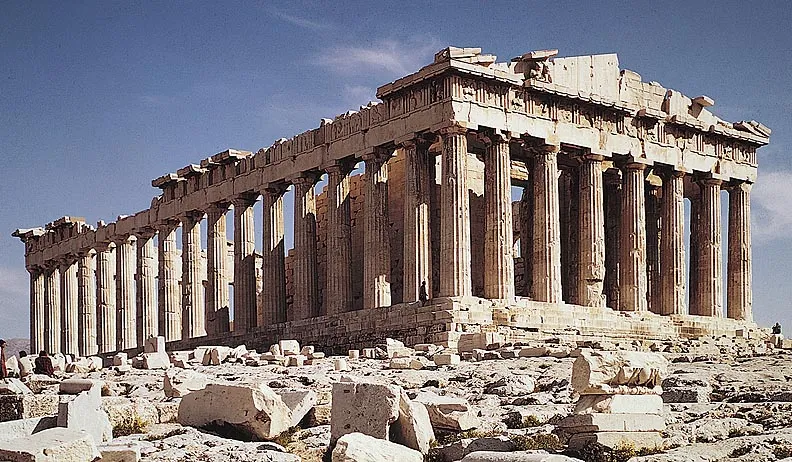

In [177]:
src = cv2.imread('temple.webp')
show(src)


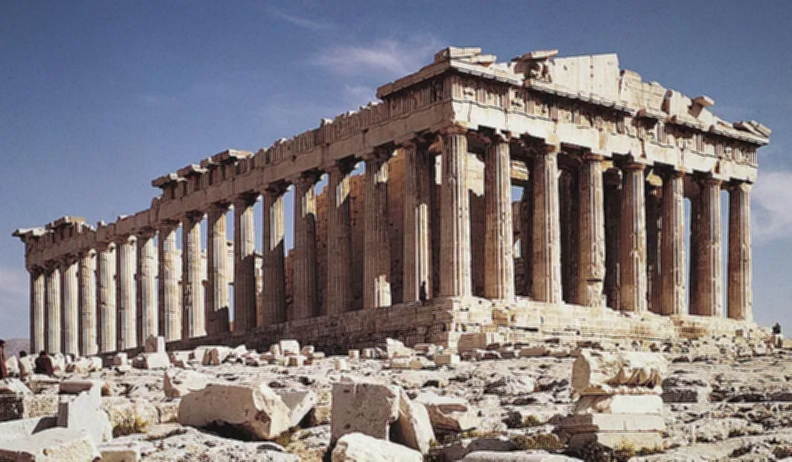

In [181]:
kernel = np.array([
    [1/9, 1/9, 1/9], 
    [1/9, 1/9, 1/9], 
    [1/9, 1/9, 1/9]], dtype=np.float32)
dst = cv2.filter2D(src, -1, kernel)
show(dst)


고주파를 없애는 방법은 뭐냐면 고주파라는 건 이렇게 촘촘하게 빨리 변하니까 얘랑 얘를 그냥 더해버리면 얘는 높고 얘는 낮으니까 더하면은 뭉개져서 이렇게 없어져 버리겠죠

그죠?

근데 저주파는 완만하게 변하니까 얘랑 얘를 더해봤자 이렇게 되니까 사실 뭐 별 차이가 없어요

얘랑 얘를 더해봤자 이렇게 되고 그러니까는 고주파는 뭉개져서 이렇게 되니까 그러니까는 고주파는 뭉개져서 이 좁은 범위에서 컨볼루션을 서로 더해서 뭉개버리면 없어지는데 저주파는 뭉개봤자 그게 그거기 때문에 별로 변화가 없습니다

그래서 이제 요런식으로 컨볼루션 커널을 만들어가지고 지금 1 9분의 1 1 9분의 1 1 9분의 1 1 9분의 1 1 9분의 1 1 9분의 1 1 9분의 1 하면 만약에 우리가 고주파라고 하면은 여기는 높고 이렇게 가서 여기는 낮고 이렇게 가는데 그러면 이거랑 이거를 다 1 9분의 1씩 곱해가지고 더해버리니까 이렇게 되니까 그냥 0이 되어버리겠죠

그래서 평균값 필터링 요런식으로 숫자를 1 9분의 1씩 다 채워서 하면은 뭘 하는거랑 똑같으냐면 블러를 하는거랑 똑같고 앞에서 했던 공간주파수 관점에서는 저주파 필터링을 하는거랑 똑같습니다

그래서 요거를 해보면 지금 원래 원래 이미지는 아 이렇게 선명한 파르테논 신전인가요

요런 이미지인데 요거를 블러링을 하면은 여기가 흐릿하게 되요

여기 보시면은 아주 선명하게 이렇게 기둥이 있는데 고주파가 다 뭉개져가지고 저주파만 남기 때문에 흐릿하게 이렇게 뭉개지게 됩니다

더 저주파만 남기고 싶으면 어떻게 하면 될까요

요 필터의 크기를 더 키우면 되겠죠

지금은 3칸 내에서 아주 좁은 범위에서만 뭉개기 때문에 아주 고주파만 뭉개집니다

왜냐하면은 여기서 플러스 여기서 플러스고 여기서 마이너스고 이런 주파수여야 뭉개지지 둘다 플러스면은 별로 안 뭉개질거 아니에요

그러면은 예를 들면 이렇게 완만하게 변하는것도 뭉개고 싶으면은 이거를 크기를 키워야 이렇게 이렇게 예를 들면은 이렇게 된 고주파는 여기랑 여기랑 서로 뭉개져가지고 없어지는데 예를 들면 조금만 이렇게 돼도 어차피 여기랑 여기를 뭉개 봤자 차이가 별로 없단 말이에요

그래서 필터를 더 키워야 여기랑 여기가 서로 뭉개져가지고 없어지겠죠

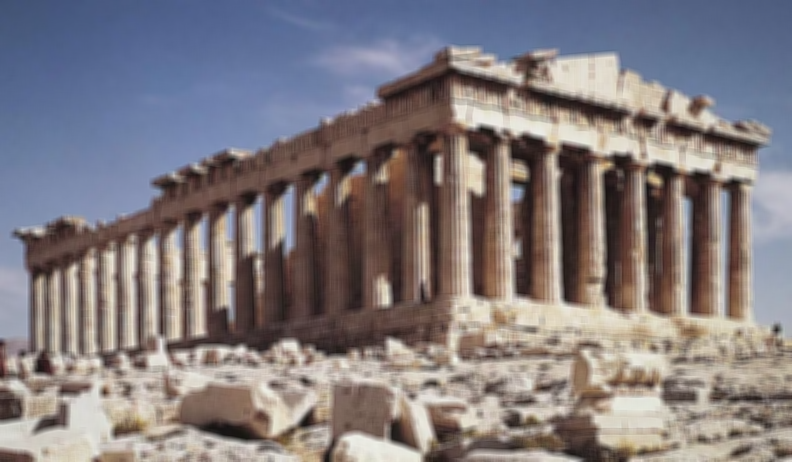

In [183]:
kernel = np.ones((7,7), dtype=np.float32) / 49
dst = cv2.filter2D(src, -1, kernel)
show(dst)

그래서 요거 사이즈를 지금 3X3인데 만약에 더 뭉개고 싶다

그럼

요거를 더 키우시면 됩니다


예를 들면 7x7로 뭉개고 싶으면 여기를 7x7 이렇게 쓰고 여기는 49 이렇게 해주면 되겠죠

그럼 더 많이 뭉개지게 됩니다

그래서 요 크기를 키워주면 키워줄 필터를 키워주면 키워줄수록 점점 더 고주파들이 서로 다 뭉개져 가지고 없어져 버리겠죠
## 가우시안 블러링 

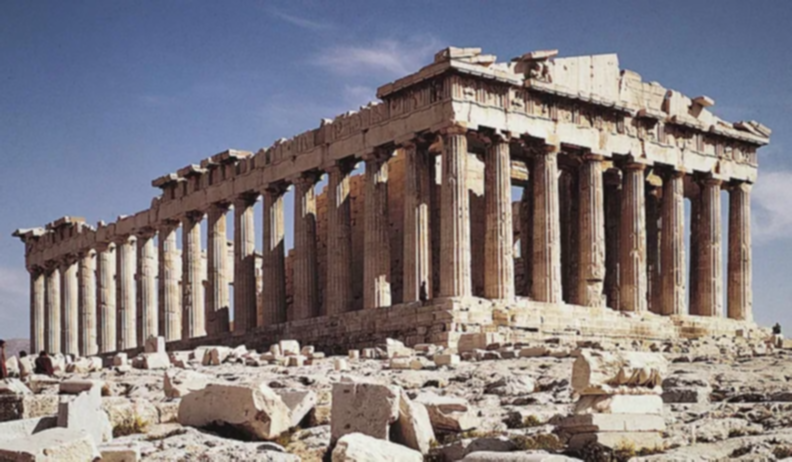

In [201]:
blur = cv2.GaussianBlur(src, (5, 5), 0)
show(blur)

이렇게 이제 다 똑같은 값으로 뭉개 버리는 방법도 있는데 블러를 할 때 이미지를 흐리게 만들 때 가오시안 블러링이라고 하는 방법도 많이 사용합니다

가오시안 블러는 이름이 왜 가오시안 블러냐면 가오시안 함수는 여러분도 잘 아시는 전기분포 있죠

이렇게 생긴 거 이거를 입체로 그리면 이렇게 되거든요

산봉오리처럼 가운데에는 많이 반영하고 주변으로 갈수록 서서히 반영률을 낮추는 이거를 위에서 보면 가운데에는 반영을 많이 하고 옆으로 갈수록 점점 반영률을 완만하게 낮추는 이런 형태가 되는데 평균가 필터링 같은 경우는 문제가 뭐냐면 필터가 커지면 되게 멀리 있는 것들끼리 서로 상쇄를 시키기 때문에 약간 좀 왜곡이 생기거든요

가오시안은 가까운 거를 많이 반영하고 멀리 떨어져 있는 건 조금 반영하니까 좀 더 자연스럽게 뭉개지죠

그래서 우리가 이제 이걸 손으로 계산을 해 갖고 넣을 수도 있는데 가오시안 블러라는 함수가 있어서 여기서 사이즈를 이렇게 5X5 넣어주면 그 사이즈로 블러링을 해줍니다

## 샤프닝



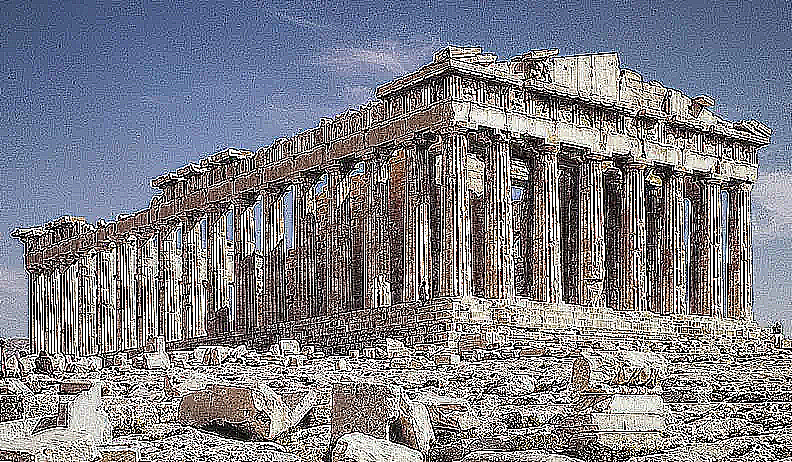

In [189]:
kernel = np.array([
    [-1, -1, -1], 
    [-1, 9, -1], 
    [-1, -1, -1]], dtype=np.float32)
dst = cv2.filter2D(src, -1, kernel)
show(dst)

자 그 다음에 어 샤프닝 이라고 해서 그 이미지를 날카롭게 만들 수도 있는데 애초에 아까 흐릿하게 찍혔으면 은 반대로 역 역산을 해주는 거예요

그 사진을 찍었는데 초점이 좀 안 맞아서 흐릿하게 찍혔어요

그러면은 흐릿하게 찍혔다는 것은 뭔가 뭉개져 있다는 거니까 그 뭉개져 있는 것을 반대 계산을 해 주면 되겠죠

그래서 어떻게 하냐면 여기 커널 숫자를 보시면은 그 뭉개져 있는 거를 반대 계산을 해 주면 되겠죠

그래서 어떻게 하냐면 여기 커널 숫자를 보시면은 이제 총 밝기는 똑같고 그 다음에 이걸 다 계산하면 가운데 밝기가 확 올라가겠죠

그래서 주변 픽셀하고 밝기 차이를 과장을 하는 거에요

그래서 블러 같은 경우는 그냥 오른쪽이나 왼쪽이나 다 비슷비슷하게 평균을 내면은 가우시한 블러는 조금 다르지만 어쨌든 결국에는 블러를 하는 거는 그냥 너 것도 좀 섞고 내 것도 좀 섞고 다 섞어 가지고 비슷비슷하게 만드는 거고 샤프닝은 반대로 서로 차이를 최대한 벌리는 겁니다

그러면은 이미지가 더 선명해지겠죠

단점은 보시면 여기 하늘을 보시면 하늘이 굉장히 자글자글하게 생기거든요 하늘 같은 경우는 사실 저주파 밖에 없어서 여기 무슨 샤프닝 할 게 없는데 여기다가 샤프닝을 먹이니까는 없는 노이즈라는 게 결국 이런 거죠

아무것도 없는데 거기서 뭐가 시그널이 발생하는 그러니까 굉장히 사실 의미 없는 차이가 있는 거를 오히려 과장을 해서 이런 데는 오히려 노이즈가 생겨나게 되죠

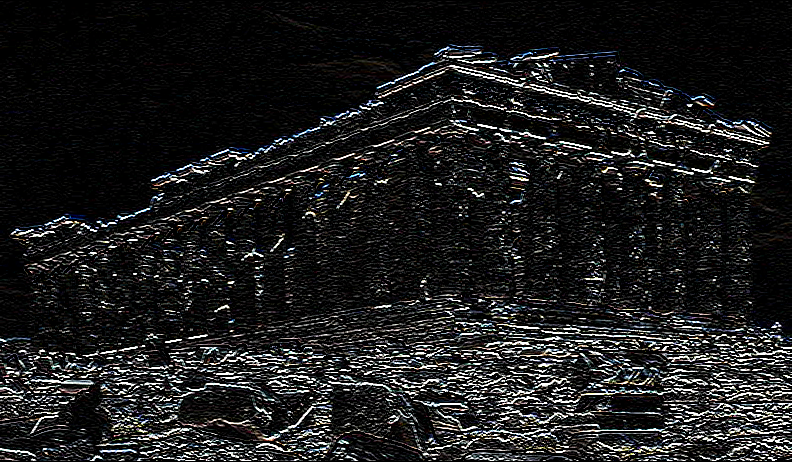

In [191]:
kernel = np.array([
    [1, 1, 1], 
    [0, 0, 0], 
    [-1, -1, -1]], dtype=np.float32)
dst = cv2.filter2D(src, -1, kernel)
show(dst)

그래서 여기 3x3에 들어가는 숫자를 잘 조정을 해 주면 여러 가지를 할 수 있는데 아까 예시로 드렸던 것처럼 여기 가운데가 이렇게 000이고 왼쪽이 111이고 이렇게 하면은 요 방향의 밝기 변화를 탐지한다고 했었죠

그래서 실제로 이렇게 돌려보면은 지금 보시면은 수직으로 하얀 선들이 짝짝짝짝짝짝인데 이 하얀 선은 뭐냐면 이제 왼쪽은 밝고 오른쪽은 어두운 데에서만 하얀 선이 이렇게 그어지게 됩니다

그리고 보시면은 여기 지붕인데 원래 그림을 보면 지붕에 이렇게 가로선이 있죠

가로로 밝기 변화가 있거든요

위에는 하얗고 밑에는 그림자여서 어둡고 이 가로로 밝기 변화가 있는데 밑에 그림을 보시면 고기는 뭉개져서 없어져 있어요

그죠

지붕에서 이 그림자 지는 부분은 다 뭉개져 있어요

다 뭉개져서 없어져 있습니다

왜냐하면 요 필터는 세로 변화에만 반응하기 때문에 그래요

그래서 어떤 이미지에서 결국 이거는 뭡니까

그 가로 방향의 주파수는 남기고 세로 방향의 주파수는 다 뭉개서 없애버린 거죠

그 다음에 이제 반대로 그러면은 아 111 이렇게 위에다가 쓰고 000 이렇게 쓰고 그 다음에 맨 밑에는 마이너스 1 마이너스 1 마이너스 1 이렇게 쓰면 어떻게 되겠어요

그러면은 아까 제가 없어졌다고 했던 요 지붕에 요 위쪽에 첨화 부분에 요 경계선 요 경계선은 뚜렷하게 보이죠

왜냐하면 위에는 밝고 밑에는 어두우니까 근데 지금 기둥에 세로선이 쭈루루룩 있어야 되는데 여기 보시면 이렇게 세로선이 쭈루룩 있어야 되는데 세로선은 다 뭉개서 없어져 있습니다

그래서 어떤 이미지에서 수평 수직 방향에 지금 이제 요런 식으로 주면은 수직 방향에 어떤 변화는 없어져 있어요.

그 변화는 우리가 탐지를 해낼 수가 있는 거죠

그래서 이런 식으로 여기 들어가는 숫자를 조합을 어떻게 잘 하는 것만으로도 굉장히 다양한 그 변화를 탐지를 해낼 수가 있습니다

## 케니 에지 검출

그래서 이제 이거를 연장을 하면은 우리가 이제 경계선 검출 알고리즘을 만들 수 있는데 필터만 가지고 되는 건 아니고 그 앞단 뒷단에 전처리 후처리를 잘 해주면 여기 보시는 것처럼 어떤 경계선들을 검출을 할 수가 있습니다.

그래서 경계선 검출은 해서 뭘 하느냐 하면은 여러가지 용도를 생각을 할 수가 있는데 예를 들어서 진짜로 미군에 보급이 돼 있는 건지는 모르겠는데 실제로 미군에 보급이 돼 있다는 소문도 있고 그냥 시연 영상 이라는 얘기도 있는데 지금 야시경 아시죠?

야시경, 야간투시경인데 미군 야간투시경에 실제로 보급이 됐는지는 모르겠어요.

지금 보면은 이런 식으로 보인대요.

보면은 이게 지금 대포인데 한밤중에 이거 야간투시경을 보면은 대포의 경계선 있잖아요.

근데 이게 야간투시경을 써도 어차피 다 초록색이라가지고 약간 물체 형상이 희끄무리해서 구별이 잘 안가는데 이렇게 지평선이라든지 이런 경계선 부분에 자동으로 엣지를 탐지를 해가지고 경계선을 이렇게 테두리를 쳐서 표시를 넣어주는 겁니다.

그래서 지금 보시면은 이렇게 사람 테두리를 이렇게 해서 무슨 만화 보는 것처럼 밤에 이걸 쓰고 보면 엄청 잘 보이겠죠.

선으로 딱 테두리를 쳐주니까 일반적인 야간투시경은 어떻게 보입니까?

일반적인 일반적인 야간투시경은 일반적인 야간투시경은 뭐 이 정도로밖에 안보이죠.

보면은 그냥 이렇게 보이는데 이 정도로 잘 보이지도 않아요.

그죠?

여기다가 밤이라서 어두워서 잘 안보이니까 이렇게 테두리를 이렇게 야투시경에다가 엣지탐지 기능을 필터를 하나 넣어가지고 여기다 이제 테두리를 쳐준다

이런 얘기죠.

그래서 그 테두리를 쳐주는 거는 사실 알고리즘이 다 있기 때문에 야간투시경에 반도체에 넣어가지고 그 계산할 수 있게 해주면 됩니다.

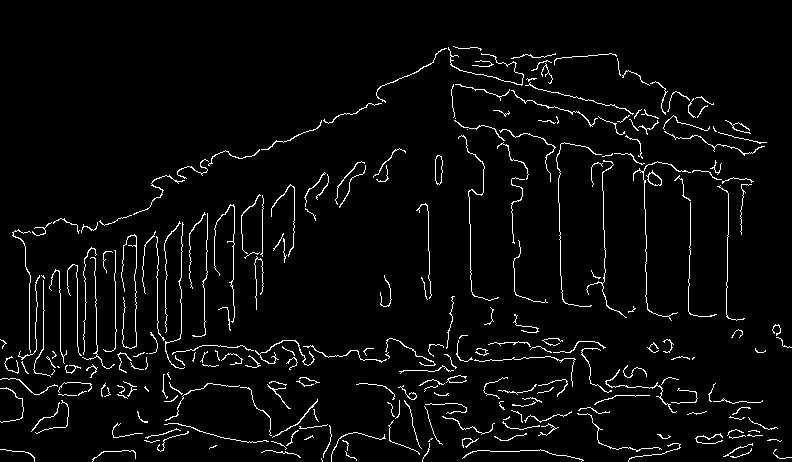

In [214]:
blur = cv2.GaussianBlur(src, (15, 15), 0)
med = np.median(src)  # 중간값
lower = int(max(0, 0.7*med)) #하한 임계값을 0 또는 중간값의 70%로 설정 
upper = int(min(255, 1.3*med)) #상한 임계값을 중간값의 130% 또는 255로 설정
edges = cv2.Canny(blur, lower, upper)
Image.fromarray(edges)


여기 보시면은 우리가 중간값을 기준으로 밝기의 중간값이죠

밝기의 중간값으로 중간값 대비해서 70% 수준부터 플러스 마이너스 30% 범위 내에서만 밝기 변화는 구간을 찾는데 이거를 조금 늘리고 줄이고 하는 거에 따라서 이제 결과가 달라지게 됩니다

그래서 숫자를 바꿔가면서 어떻게 달라지는지 보시면 되고 그 다음에 이제 블러를 여기다 붙여 놓읍시다

지금 보면은 이런 데가 자글자글하니 바닥에 돌 깔려 있는 게 자글자글한데 우리가 이제 블러랑 조합을 해 가지고 블러를 조금 더 키워 주거나 예를 들면 7 같은 코드라도 7 7 이렇게 키워 주면은 보시면은 자글자글한 건 별로 안 없어지는데 여기 기둥 있는데 보면은 선들이 좀 없어지거든요

이걸 좀 더 키워 보면은 예를 들면 15 이렇게 키워 주면은 보시면은 선들이 더 단순해지죠

그래서 경계선 탐지라는 게 결국에는 고주파만 통과를 시키는 거예요

고주파를 통과시키기 전에 한번 뭉개주면은 쓸데없는 노이즈 같은 거에 따라서 우리가 이제 적당한 고주파를 뽑아 내야 되는데 왜냐면은 노이즈도 대체로 고주파 거든요

예를 들면 바닥에 자갈이 깔려 있다 그럼 자갈은 엄청 고주파잖아요

사실 우리가 자갈의 윤곽 하나 하나까지 별로 알고 싶진 않단 말이에요

예를 들면은 주차장에 차들이 있는데 차들 사이에 차를 딱 대고 싶어요

그럼 차의 윤곽만 알면 되는데 주차장 바닥에 자갈이 깔려 있으면 자갈은 우리가 주차하는데 사실 별로 중요한 정보가 아니란 말이에요

그래서 저주파를 적당하게 결국에는 어떤 우리가 원하는 대역의 주파수만 잘라내고 싶으면 저주파 필터 통과 필터를 이용해서 너무 자잘한 고주파도 날려버리고 그 다음에 캐니에서 또 너무 필요 없는 저주파도 날려버리고 예를 들면 차 주차장이 되어야 되는데 저기 하늘에 멀리 떠다니는 뭉개구름 이런 거는 또 너무 저주파란 말이에요

그런 애들은 날려버리고 이렇게 해서 우리가 이제 상하방으로 불필요한 걸 날려버리는데 어느 정도를 날려야 되는데 이거는 정답은 없습니다

그래서 이런 거는 숫자들을 조정을 해 가면서 적당한 숫자값을 찾아야겠죠

그래서 이런 식으로 하는 거고 그래서 여기 이제 캐니에지 검출 다음에 보시면은 엣지주출전 블러 이렇게 되는데 우리가 이제 보통 잡음이 고주파기 때문에 블러를 해 가지고 노이즈를 제거를 하는 거예요

여기 보시면은 이제 고양이 이미지인데 고양이 같은 경우는 우리가 고양이의 윤곽을 알고 싶은 건데 고양이는 털이 있어 가지고 털은 엄청 고집하거든요

왜냐면 진짜 이렇게 움직이잖아요

그죠?

그러니까는 고양이 털이 있는 상태에서 엣지 추출을 걸어 버리면 털마다 엣지가 다 뽑혀 나와 가지고 우리가 고양이의 윤곽을 알 수가 없습니다

여기 보시면 지금 계속 움직이는데 이때 보면은 윤곽을 알 수가 없죠

그래서 약간 블러를 해 가지고 오히려 털을 좀 뭉개줘야 털이 경계가 구별 안 돼 뭉개져야 오히려 역설적이지만은 고양이의 윤곽을 더 잘 알 수가 있습니다

그래서 이렇게 블러랑 섞어 주시면 여기 블러랑 섞어 주시면 잘 되는데 블러도 근데 또 너무 많이 먹으면 안 되겠죠

그럼

우리가 원하는 윤곽까지 뭉개지니까 우리가 원하는 윤곽은 뭉가지 않는 선에서 쓸데없는 거는 뭉개질 정도로 블러링을 먼저 해 주시면 좋습니다

## 모폴로지

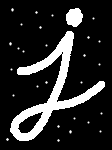

In [216]:
dot = cv2.imread('morph_dot.png')
Image.fromarray(dot)

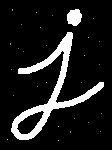

In [217]:
kernel = cv2.getStructuringElement(cv2.MORPH_CROSS, (3,3))
Image.fromarray(cv2.erode(dot, kernel))

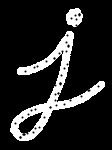

In [218]:
hole = cv2.imread('morph_hole.png')
Image.fromarray(hole)

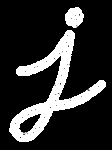

In [219]:
Image.fromarray(cv2.dilate(hole, kernel))

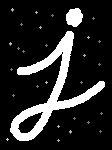

In [220]:
Image.fromarray(cv2.morphologyEx(dot, cv2.MORPH_OPEN, kernel))

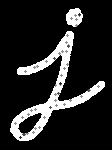

In [221]:
Image.fromarray(cv2.morphologyEx(hole, cv2.MORPH_CLOSE, kernel))

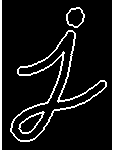

In [222]:
src = cv2.imread('morphological.png')
Image.fromarray(cv2.morphologyEx(src, cv2.MORPH_GRADIENT, kernel))

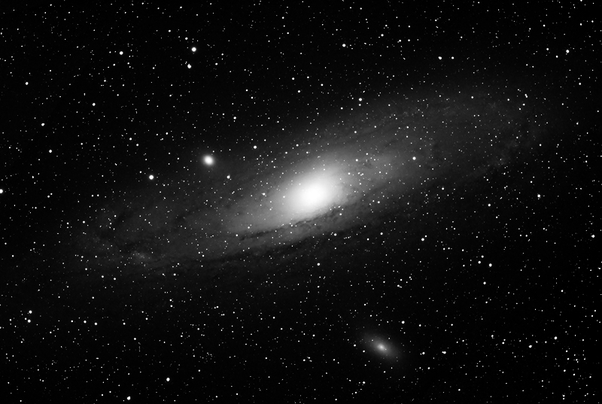

In [223]:
src = cv2.imread('galaxy.png')
Image.fromarray(src)

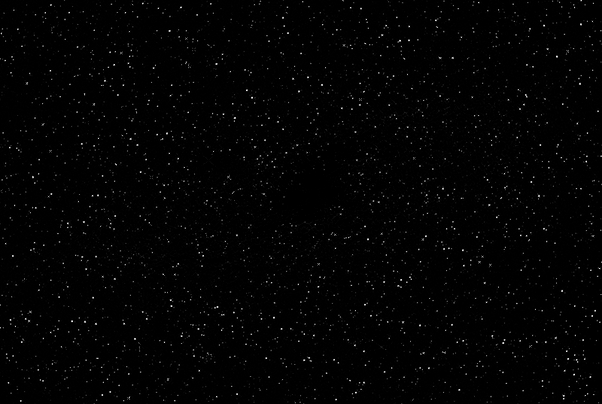

In [224]:
Image.fromarray(cv2.morphologyEx(src, cv2.MORPH_TOPHAT, kernel))

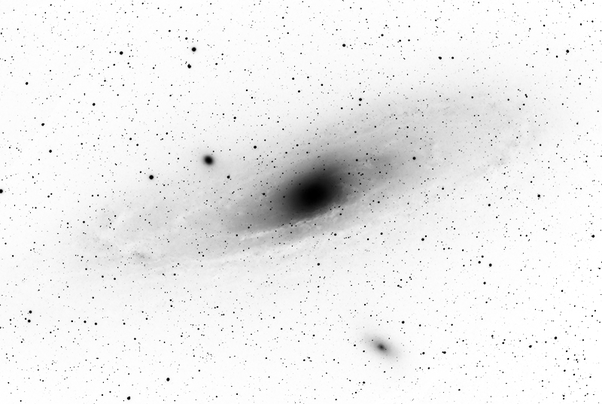

In [226]:
inv = 255 - src
Image.fromarray(inv)

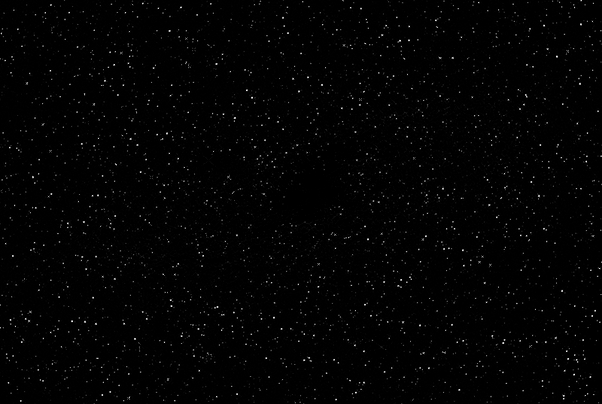

In [227]:
Image.fromarray(cv2.morphologyEx(inv, cv2.MORPH_BLACKHAT, kernel))

그래서 이런 식으로 하는 게 이제 모폴로지 연산인데 그래서 침식 연산을 하면은 이 십자가 모양으로 해서 쉽게 말해서 전후 좌우에 모두 픽셀이 있는 그런 픽셀만 남기고 다 깎아 내버린다

이런 거죠

이로드라고 돼 있는데 침식이라는 뜻입니다

그 다음에 이제 팽창 연산은 반대로 침식을 반대로 하는 거 그래서 딜레이트 이렇게 돼 있는데 보시면은 이런 거는 이렇게 구멍이 돼 있는 부분이 있는데 구멍이 돼 있는 부분이 메꿔져 가지고 이렇게 구멍이 작아지죠

그래서 이런 식으로 이제 메꿔지게 되고 그 다음에 이제 그러면 침식을 먼저 했다가 팽창을 시키면 우리가 이제 이런 글자가 있는데 여기 앞에 여기를 일단 먼저 깎아내요 침식을 시켜서 깎아내면 이런 점들이 작아지고 일부 점들은 아예 없어집니다 없어진 거를 다시 팽창을 시키려고 해도 점이 없으니까 팽창이 안 되겠죠

그래서 침식을 먼저 하고 팽창을 나중에 하면은 이런 여기 있는 점들 노이즈들을 많이 제거를 할 수가 있습니다

그리고 여기는 글자 있는 부분은 깎여 나갔다가 다시 팽창을 해서 채워 넣으니까 제자리겠죠

그래서 앞에 보시면 이게 침식을 하면은 글자가 지금 자세히 보시면 좀 가늘어져 있거든요

깎여 나가서 이렇게 깎아진 거를 팽창을 하니까 다시 원상복귀가 되죠

이런 식으로 하는 거를 열림

연산이라고 합니다

왜 열림

연산이라고 하는지 저도 잘 모르겠는데 일단 먼저 깎고 그 다음에 다시 채워 놓는 거예요

그 다음에 반대로 여기 보시면 구멍이 이렇게 빵빵빵빵 뚫려 있는데 이거를 팽창을 시키면은 구멍이 좀 메꿔집니다

구멍이 메꿔지는데 잘 보시면 글자도 굵어지거든요

그러면은 일단 구멍을 메꿔놓고 다시 한번 깎으면 여기 보시는 것처럼 글자의 굵기가 다시 원래대로 돌아오죠 부풀려졌던 게 깎여 나가니까 그 다음에 팽창을 하면서 구멍이 메워졌기 때문에 다시 깎아내려고 해도 어차피 메워진 구멍은 이제 안 보이니까 깎을 수가 없는 거죠

그래서 이런 식으로 뭔가 밝은 점들이 있는 경우에는 침식을 먼저 팽창을 나중에 하는 게 좋고 이렇게 구멍이 까만 구멍이 뽕뽕 뚫린 경우에는 팽창을 해서 메꾼 다음에 덧붙은 내용을 깎아내는 팽창 다음에 깎아내면은 침식을 깎아내는 팽창 다음에 침식 이런 식으로 하는 게 좋습니다

그 다음에 경계선을 추출하는 방법 중에 모폴로지 그래디언트라는 게 있는데 이건 뭐냐면 팽창을 한 거에서 침식을 한 거를 빼는 거예요

무슨 말이냐면 예를 들어서 어떤 이런 모양이 있는데 요거를 팽창을 시켜요

그럼 이렇게 두꺼워지겠죠

그 다음에 침식을 시켜요

그럼 침식을 시키면 이렇게 작아지겠죠

그럼 두꺼운 거에서 작은 거를 빼면은 이렇게 경계선만 남는다

이런 논리입니다

그래서 이 i자가 있는데 i자를 팽창시키면 얘가 이렇게 두꺼워질 거고 침식을 시키면 이 파내니까 안에만 이렇게 남을 건데 안에만 이렇게 남을 건데 그러면 두꺼워진 거에서 안에만 남은 걸 골격을 빼버리니까 이렇게 테두리만 남게 되죠

이걸 모폴로지 그래디언트라고 하고 앞에서 봤던 캔이 엣지 디텍터하고 또 다른 경계선 탐출 방법입니다

많이 쓰는 건 아닌데 이런 식으로도 경계선을 뽑아낼 수 있다

이런 얘기고요 그 다음에 이제 그럼 이렇게 빼는 거를 팽창에서 침식을 빼는 대신에 원본에서 열림을 빼면 어떻게 되느냐 보면 좀 복잡한데 열림은 뭐냐면 침식에서 팽창을 빼가지고 깎은 다음에 다시 덧붙여서 밝은 노이즈를 제거를 하고 하는 거죠

그러면 열림은 밝은 노이즈가 없는 거고 원본은 밝은 노이즈가 있겠죠

그럼 두 개를 빼면 어떻게 되냐면 밝은 노이즈만 남습니다

그래서 여기 왼쪽을 보시면 여기 은하가 있고 이렇게 별들이 있는데 여기서 보면 이제 별들이 일종의 노이즈죠 점으로 점점점점점이 있는 거니까 이게 원본이고 우리가 이거를 열림

연산을 하면 이런 별들이 다 깎여 나가서 없어진단 말이에요

그럼 두 개를 빼면 열림이 없어집니다.

그러면 두 개를 빼면 열림이 없어집니다.

그러면 두 개를 빼면 열림이 없어집니다.

이 가운데 있는 이게 없어지는 거예요

이해되시죠

그래서 결과적으로 이 가운데 있는 이게 날라가고 이 별들만 남게 됩니다

이런 식으로 이제 원하는 것만 남기는 거죠

그럼 반대로 하는 것도 있겠죠

예를 들면 흰 바탕에 검은색으로 구멍이 이렇게 뻥뻥뻥뻥 뚫려 있는데 닫힘 연산을 하면은 이게 이제 구멍을 메워 줘요 구멍을 매웁니다

구멍을 메우면 구멍이 없으니까 원본에는 이렇게 구멍이 있는 구멍이 없으니까 결국에는 이 두 개를 빼주면 차이가 구멍만 남겠죠

그래서 이런 거를 블랙헷이라고 합니다

그래서 이제 이런 식으로 뭔가 이렇게 채웠다가 메웠다가 하는 거를 이용을 해 가지고 여러 가지 연산을 할 수 있는데 이 모든 연산은 이진화된 바이너리 이미지에만 적용을 할 수 있어요

그래서 이거는 일반적인 이미지가 아니고 검은색 흰색 이렇게 두 가지만 있는 경우에만 할 수 있는 연산이다

그래서 이제 뭐 노이즈를 제거한다든지 이럴 때 이렇게 쓰시면 됩니다